# STEP 01: ETL, Version 001

In this notebook, the data extraction is covered. There are three data sources that are processed:

1. Weather: Information on temperature, cloud coverage, precipitation, etc at the location using the DarkSkyAPI
2. Sun position: Information on the position of the sun in the sky at the location using pysolar.solar
3. Solar panel production: Information on the amount of energy produced by the solar panels at the location

# Weather Data

The first step is to get the weather data for the location where the solar panel is located. The location coordinates can be taken for example from Google Maps (latitude, longitude). In this case, the location information is stored in a file along with the secret for the API of DarkSky (https://darksky.net/dev). Signup there is free, as long as one stays below 1000 API calls per 24 hours. 

The way this works is that the DarkSky API is called and returns hourly, historical data for each day that is requested. The response from the API (json files) will be stored locally and then be processed into one big csv file with all the data from the API. For the Time Series Analysis, not all data is relevant and it will be cleaned later on.

In [59]:
import datetime
from time import mktime
import pandas as pd
import requests
import re
import json
import os
import plotly
plotly.offline.init_notebook_mode(connected=True)


from dateutil import tz
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

## 1. Get the location where the solar panel is, get DarkSkyAPI

In [42]:
location = [0,0]
DarkSkySecret = 'none'
credentials = './.credentials.pw'

with open(credentials, 'r') as file:
    for line in file:
        line = line.rstrip().split(',')
        if 'Location' in line[0]:
            location[0] = line[1]
            location[1] = line[2] 
        if 'DarkSkyAPI' in line[0]:
            DarkSkySecret = line[1]
    file.close()

## 2. Testing the API: Pick a date in the past and get hourly data from API

Documentation of the DarkSkyAPI is under: https://darksky.net/dev/docs


Note that the API returns the time in the **local** time zone

In [55]:
# create some date
mydate = '1527559200'
# date = datetime.datetime.strptime(mydate, '%Y-%m-%d')

# option list for API
option_list = "exclude=currently,minutely,alerts&units=si"


# call API
latitude = str(location[0])
longitude = str(location[1])

response = requests.get("https://api.darksky.net/forecast/"+DarkSkySecret+"/"+latitude+","+longitude+","+mydate+"?"+option_list)
json_res = response.json()
mylist = json_res['hourly']['data']
print(f'For this day there are {len(mylist)} records from the API')
mylist[4]

For this day there are 24 records from the API


{'time': 1527559200,
 'summary': 'Overcast',
 'icon': 'cloudy',
 'precipType': 'rain',
 'temperature': 19.07,
 'apparentTemperature': 19.07,
 'dewPoint': 15,
 'humidity': 0.77,
 'windSpeed': 3.6,
 'windBearing': 230,
 'cloudCover': 1,
 'uvIndex': 0,
 'visibility': 10.003}

## 3. Plots

Check first that the local time is correct

In [12]:
mylist = json_res['hourly']['data']

# .strftime('%Y-%m-%d %H:%M:%S')
from_zone = tz.tzutc()
to_zone = tz.tzlocal()
times = []
for t in mylist:
    utc_time = datetime.datetime.utcfromtimestamp(t['time'])
    
    # Tell the datetime object that it's in UTC time zone since 
    # datetime objects are 'naive' by default
    utc_time = utc_time.replace(tzinfo=from_zone)

    # Convert time zone
    localtime = utc_time.astimezone(to_zone)
    times.append(localtime.hour)
    print(localtime)

2018-05-21 00:00:00+02:00
2018-05-21 01:00:00+02:00
2018-05-21 02:00:00+02:00
2018-05-21 03:00:00+02:00
2018-05-21 04:00:00+02:00
2018-05-21 05:00:00+02:00
2018-05-21 06:00:00+02:00
2018-05-21 07:00:00+02:00
2018-05-21 08:00:00+02:00
2018-05-21 09:00:00+02:00
2018-05-21 10:00:00+02:00
2018-05-21 11:00:00+02:00
2018-05-21 12:00:00+02:00
2018-05-21 13:00:00+02:00
2018-05-21 14:00:00+02:00
2018-05-21 15:00:00+02:00
2018-05-21 16:00:00+02:00
2018-05-21 17:00:00+02:00
2018-05-21 18:00:00+02:00
2018-05-21 19:00:00+02:00
2018-05-21 20:00:00+02:00
2018-05-21 21:00:00+02:00
2018-05-21 22:00:00+02:00
2018-05-21 23:00:00+02:00


In [13]:
temperatures = []
for t in mylist:
#     print(t['temperature'])
    temperatures.append(t['temperature'])

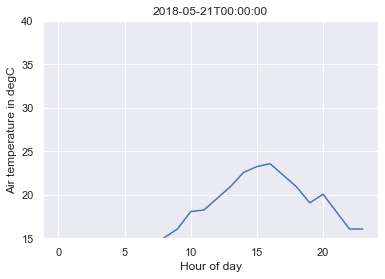

In [14]:
plt.plot(times, temperatures)
plt.xlabel('Hour of day')
plt.ylabel('Air temperature in degC')
plt.title(mydate)
plt.ylim(15,40)
plt.show()

## 4. Make a function

- Inputs: 
    - location: location where the weather should be requested. Format: ['longitude', 'latitude]
    - day: day for which hourly data should be requested. Format: '2019-06-26T12:00:00'
- Output:
    - json object from the API

In [73]:
import datetime
import pandas as pd
import requests
import re
import json

def getWeatherData(location, UNIX_time):
    # option list for API
    option_list = "exclude=currently,minutely,alerts&units=si"

    # call API
    latitude = location[0]
    longitude = location[1]

    response = requests.get("https://api.darksky.net/forecast/"+DarkSkySecret+"/"+latitude+","+longitude+","+str(UNIX_time)+"?"+option_list)
    json_res = response.json()
    
    return json_res

## 5. Get the data for a certain date range

Repeatedly calls to the getWeatherData-function will get the weather data for the location for the respective day hourly. The reponse json object will be stored in a folder for further processing.

In [75]:
# where to store the API data
save_path = "./data/DarkSkyAPI/"

# date range
startDate = '2017-11-01'
endDate = '2019-06-27'

# convert to a time delta
d_from_date = datetime.datetime.strptime(startDate, '%Y-%m-%d')
d_to_date = datetime.datetime.strptime(endDate , '%Y-%m-%d')
delta = d_to_date - d_from_date

# for every day in the date range, get the data
for i in range(delta.days+1):
#     new_date = (d_from_date + datetime.timedelta(days=i)).strftime('%Y-%m-%d')
    new_date = (d_from_date + datetime.timedelta(days=i)) + pd.DateOffset(hours=15)

    # convert to datetime
    new_date = new_date.to_pydatetime()  

    # convert the date to UNIX time
    UNIX_time = mktime(new_date.timetuple())
    
    # call API
    data = getWeatherData(location, UNIX_time)
    
    # write to file
    with open(f'{save_path}/{new_date}.json', 'w') as outfile:  
        json.dump(data, outfile)
        outfile.close()

## 6. Clean up the weather data

Now that the data for each day is stored as a json object, it can be cleaned up. First, lets explore the dataset structure.

In [36]:
path_to_jsons = './data/DarkSkyAPI/'

# list all the json objects in the path
jsons = os.listdir(path_to_jsons)
# make sure that there are only json files
jsons = [j for j in jsons if j.endswith('.json')]

# load one file to examine
with open(f'{path_to_jsons}{jsons[0]}') as f:
    d = json.load(f)
    f.close()
    
    
d.keys()

dict_keys(['latitude', 'longitude', 'timezone', 'hourly', 'daily', 'flags', 'offset'])

It seems that the jsons contain as a dictionary the entries 'latitude', 'longitude', 'timezone', 'hourly', 'daily', 'flags', 'offset'. Lets check what those contain.

In [5]:
for key in d.keys():
    print(f'Key {key} contains: {d[key]}')

Key latitude contains: 47.964718
Key longitude contains: 7.955852
Key timezone contains: Europe/Berlin
Key hourly contains: {'summary': 'Foggy starting in the morning.', 'icon': 'fog', 'data': [{'time': 1548025200, 'summary': 'Partly Cloudy', 'icon': 'partly-cloudy-night', 'precipIntensity': 0.01, 'precipProbability': 0.01, 'precipType': 'snow', 'precipAccumulation': 0.06, 'temperature': -1.33, 'apparentTemperature': -1.33, 'dewPoint': -5.05, 'humidity': 0.76, 'pressure': 1019.68, 'windSpeed': 1.09, 'windGust': 1.44, 'windBearing': 81, 'cloudCover': 0.48, 'uvIndex': 0, 'visibility': 16.093, 'ozone': 343}, {'time': 1548028800, 'summary': 'Partly Cloudy', 'icon': 'partly-cloudy-night', 'precipIntensity': 0.01, 'precipProbability': 0.01, 'precipType': 'snow', 'precipAccumulation': 0.08, 'temperature': -2.05, 'apparentTemperature': -4.25, 'dewPoint': -6.1, 'humidity': 0.74, 'pressure': 1020.17, 'windSpeed': 1.59, 'windGust': 1.84, 'windBearing': 38, 'cloudCover': 0.47, 'uvIndex': 0, 'visib

The data is in the key 'hourly'. The rest is not useful information, but can be used to cross check. For further info, see the DarkSky API. The data in the 'hourly' key is stored in the 'data'-key and as a separate dictionary for each timestamp stored in a list, found via `d['hourly']['data']`. The timestamps are encoded in UNIX time. The data contained is explained in detail here: https://darksky.net/dev/docs#data-point-object




In [24]:
d['hourly']['data'][1]

{'time': 1548028800,
 'summary': 'Partly Cloudy',
 'icon': 'partly-cloudy-night',
 'precipIntensity': 0.01,
 'precipProbability': 0.01,
 'precipType': 'snow',
 'precipAccumulation': 0.08,
 'temperature': -2.05,
 'apparentTemperature': -4.25,
 'dewPoint': -6.1,
 'humidity': 0.74,
 'pressure': 1020.17,
 'windSpeed': 1.59,
 'windGust': 1.84,
 'windBearing': 38,
 'cloudCover': 0.47,
 'uvIndex': 0,
 'visibility': 16.093,
 'ozone': 342.9}

The approach now is clear: First the jsons will be loaded, the data for each timestamp extracted and all stored in a dataframe. Each row of the dataframe will correspond to one timestamp.

In [37]:
# ii = 0
df = pd.DataFrame()

# loop over the json files
for item in jsons:
# ii can be used to load just a few, uncomment the lines    
#     ii = ii + 1
#     if ii < 10:

# open the json file and load it
    with open(f'{path_to_jsons}{item}') as file:
        d = json.load(file)
        # loop over the hourly data, append it to the dataframe
        for row in d['hourly']['data']:
            s = pd.Series(row)
            df = df.append(s,ignore_index=True)

    file.close()

print(df.info())
print(df.describe())
print(df.head())

df.to_csv(f'{path_to_jsons}/darkSkyData.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14569 entries, 0 to 14568
Data columns (total 19 columns):
apparentTemperature    14569 non-null float64
cloudCover             11224 non-null float64
dewPoint               14569 non-null float64
humidity               14569 non-null float64
icon                   14569 non-null object
ozone                  8774 non-null float64
precipAccumulation     424 non-null float64
precipIntensity        14112 non-null float64
precipProbability      14112 non-null float64
precipType             6029 non-null object
pressure               14110 non-null float64
summary                14569 non-null object
temperature            14569 non-null float64
time                   14569 non-null float64
uvIndex                13175 non-null float64
visibility             12860 non-null float64
windBearing            14462 non-null float64
windGust               14085 non-null float64
windSpeed              14498 non-null float64
dtypes: float64(16), obj

Each row in the dataframe corresponds to a datapoint at one hour. As there are 24 hours in a day and each json file contains the data for one day, the number of rows divided by 24 must be equal to the number of unique timestamps in the series.

We see this is not the case, so we have to investigate what is going on!

In [39]:
assert (len(df['time'].unique())/24) == len(jsons)

AssertionError: 

Let us now convert the timestamps from UNIX time into the local time, which is in this case for the timezone that is +2 hours from the UTC.

In [40]:
def convertUNIXtoUTC(utc_time):
    """
    Takes a time in UTC time and converts it into the local time.
    """
    utc_time = datetime.datetime.utcfromtimestamp(utc_time)
    
    return utc_time

# convert UNIX to UTC time and add 2 hours to get to local time
df['date'] = df['time'].apply(lambda x: convertUNIXtoUTC(x)) + pd.DateOffset(hours=2)

# sort by the time
df_cleaned = df.sort_values(by=['time'], ascending=True)

# make the date the index
df_cleaned.set_index('date', inplace=True)

# save as csv
df_cleaned.to_csv(f'{path_to_jsons}/darkSkyData_cleaned.csv')

df_cleaned.head()

,apparentTemperature,cloudCover,dewPoint,humidity,icon,ozone,precipAccumulation,precipIntensity,precipProbability,precipType,pressure,summary,temperature,time,uvIndex,visibility,windBearing,windGust,windSpeed
date,,,,,,,,,,,,,,,,,,,
2017-10-10 00:00:00,8.02,NaN,6.87,0.92,clear-night,NaN,NaN,0.0,0.0,NaN,1023.10,Clear,8.02,1.507586e+09,0.0,9.988,167.0,0.26,0.07
2017-10-10 01:00:00,7.53,NaN,6.50,0.93,clear-night,NaN,NaN,0.0,0.0,NaN,1022.75,Clear,7.53,1.507590e+09,0.0,9.988,84.0,0.52,0.07
2017-10-10 02:00:00,7.55,NaN,6.23,0.91,clear-night,NaN,NaN,0.0,0.0,NaN,1022.64,Clear,7.55,1.507594e+09,0.0,9.988,114.0,0.69,0.13
2017-10-10 03:00:00,7.28,NaN,6.00,0.92,clear-night,NaN,NaN,0.0,0.0,NaN,1022.47,Clear,7.28,1.507597e+09,0.0,9.988,75.0,0.49,0.14
2017-10-10 04:00:00,6.78,NaN,5.70,0.93,clear-night,NaN,NaN,0.0,0.0,NaN,1022.16,Clear,6.78,1.507601e+09,0.0,9.988,70.0,0.66,0.11


In [41]:
g_by_day = df_cleaned.groupby(df_cleaned.index.date)['temperature'].count()
print(len(g_by_day[g_by_day !=24]), len(jsons))
g_by_day[g_by_day !=24]

40 626


2018-05-19    19
2018-05-20    10
2018-05-21     8
2018-05-22    13
2018-05-23    14
2018-05-24    16
2018-05-25    15
2018-05-26    10
2018-05-27    10
2018-05-28    16
2018-05-29    13
2018-05-30    14
2018-05-31    10
2018-06-01    13
2018-06-02    11
2018-06-03    12
2018-06-04    13
2018-06-05    13
2018-06-06    15
2018-06-07    13
2018-06-08    14
2018-06-09    10
2018-06-10     8
2018-06-11    14
2018-06-12    15
2018-06-13    13
2018-06-14    13
2018-06-15    13
2018-06-16     4
2018-06-17    10
2018-06-18    13
2018-06-19    13
2018-06-20    13
2018-06-21    12
2018-06-22    13
2018-06-23    12
2018-06-24    10
2018-06-25    16
2018-06-26    15
2018-06-27    16
Name: temperature, dtype: int64

It seems that for 40 days out of 626, which is around 6%, we do not have 24 datapoints. That's not great! Repeated checks with the API show that for some days, not all data is available. The cases where the API reports more than 25 entries correspond to overlapping timestamps, which is strange, but it seems in the two cases 2018-10-28 and 2017-10-29, the values match for the corresponding next day, since they are not included in that API call.

What we could do it obtain data from a different API at those dates in question or infer the values from the adjacent days. Right now, we will leave it like this but keep these missing data in mind.

In [30]:
path_to_jsons = './data/DarkSkyAPI/'
df_cleaned = pd.read_csv(f'{path_to_jsons}/darkSkyData_cleaned.csv', index_col = 0)
df_cleaned.index = pd.to_datetime(df_cleaned.index, format='%Y-%m-%d %H:%M:%S')
df_cleaned.head()

,apparentTemperature,cloudCover,dewPoint,humidity,icon,ozone,precipAccumulation,precipIntensity,precipProbability,precipType,pressure,summary,temperature,time,uvIndex,visibility,windBearing,windGust,windSpeed
date,,,,,,,,,,,,,,,,,,,
2017-10-10 00:00:00,8.02,NaN,6.87,0.92,clear-night,NaN,NaN,0.0,0.0,NaN,1023.10,Clear,8.02,1.507586e+09,0.0,9.988,167.0,0.26,0.07
2017-10-10 01:00:00,7.53,NaN,6.50,0.93,clear-night,NaN,NaN,0.0,0.0,NaN,1022.75,Clear,7.53,1.507590e+09,0.0,9.988,84.0,0.52,0.07
2017-10-10 02:00:00,7.55,NaN,6.23,0.91,clear-night,NaN,NaN,0.0,0.0,NaN,1022.64,Clear,7.55,1.507594e+09,0.0,9.988,114.0,0.69,0.13
2017-10-10 03:00:00,7.28,NaN,6.00,0.92,clear-night,NaN,NaN,0.0,0.0,NaN,1022.47,Clear,7.28,1.507597e+09,0.0,9.988,75.0,0.49,0.14
2017-10-10 04:00:00,6.78,NaN,5.70,0.93,clear-night,NaN,NaN,0.0,0.0,NaN,1022.16,Clear,6.78,1.507601e+09,0.0,9.988,70.0,0.66,0.11


## 7. Load data for another location nearby for missing datapoint

For the use of time series forecasting, we need a complete dataset. As seen earlier, the DarkSkyAPI returns not 24 timestamps for certain days (some more, some less). These values will be imputed by calling the API for the location at the closest city for these days.

Let us begin by checking again which days are not complete.

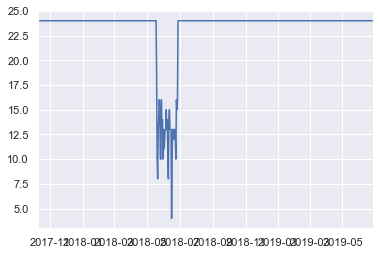

In [34]:
g_by_day.plot()
plt.show()

In [32]:
g_by_day = df_cleaned.groupby(df_cleaned.index.date)['temperature'].count()
g_by_day[g_by_day !=24]

2018-05-19    19
2018-05-20    10
2018-05-21     8
2018-05-22    13
2018-05-23    14
2018-05-24    16
2018-05-25    15
2018-05-26    10
2018-05-27    10
2018-05-28    16
2018-05-29    13
2018-05-30    14
2018-05-31    10
2018-06-01    13
2018-06-02    11
2018-06-03    12
2018-06-04    13
2018-06-05    13
2018-06-06    15
2018-06-07    13
2018-06-08    14
2018-06-09    10
2018-06-10     8
2018-06-11    14
2018-06-12    15
2018-06-13    13
2018-06-14    13
2018-06-15    13
2018-06-16     4
2018-06-17    10
2018-06-18    13
2018-06-19    13
2018-06-20    13
2018-06-21    12
2018-06-22    13
2018-06-23    12
2018-06-24    10
2018-06-25    16
2018-06-26    15
2018-06-27    16
Name: temperature, dtype: int64

# Sun position 

The next step is to get information on the position of the sun in the sky (versus hour of day). This can be easily obtained using pysolar.solar. "Pysolar is a collection of Python libraries for simulating the irradiation of any point on earth by the sun. It includes code for extremely precise ephemeris calculations, and more." as detailed in https://anaconda.org/conda-forge/pysolar. 

It can be installed in conda via `conda install -c conda-forge pysolar`.

The documentation for pysolar can be found here http://docs.pysolar.org/en/latest/

In [8]:
from pysolar.solar import *
import datetime
import pytz
import pandas as pd
import numpy as np

We select the same dates as for the weather API to collect the angle between the sun and a plane tangent to the earth where the solar panel is, the azimuth of the sun, and the clear-sky irradiation (in watts per square meter). Note that the clear-sky irradiation might not return 0 at night and does not account for scattering of light by the atmosphere.

### Create vector of times

In [9]:
# where to store the sun data data
save_path = "./data/pysolar/"

# date range same as for the DarkSkyAPI
startDate = '2017-11-01'
endDate = '2019-06-27'

# convert to a time delta
d_from_date = datetime.datetime.strptime(startDate, '%Y-%m-%d')
d_to_date = datetime.datetime.strptime(endDate , '%Y-%m-%d')
delta = d_to_date - d_from_date

# pysolar also wants the timezone information
my_timezone = pytz.timezone('Europe/Berlin')

# create a dataframe with 1 hour date timestamps between the start and end date. Take the timezone
df_solar = pd.DataFrame(pd.date_range(start=startDate, end=endDate, freq='1H', name='date'))





print(df_solar.describe())
print(df_solar.info())
print(df_solar.head())

                       date
count                 14473
unique                14473
top     2018-08-01 12:00:00
freq                      1
first   2017-11-01 00:00:00
last    2019-06-27 00:00:00
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14473 entries, 0 to 14472
Data columns (total 1 columns):
date    14473 non-null datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 113.1 KB
None
                 date
0 2017-11-01 00:00:00
1 2017-11-01 01:00:00
2 2017-11-01 02:00:00
3 2017-11-01 03:00:00
4 2017-11-01 04:00:00


That seems to have worked perfectly. Now we can use pysolar to obtain the information on the sun. Note that for this the location needs to be loaded.

### Altitude

In [10]:
# pysolar wants datetime objects, so we need to convert
def to_datetime(date, timezone):
    """
    Converts a numpy datetime64 object to a python datetime object 
    Input:
      date: np.datetime64 object
      timezone: timezone
    Output:
      DATE: a python datetime object
    """
    timestamp = ((date - np.datetime64('1970-01-01T00:00:00'))
                 / np.timedelta64(1, 's'))
    timestamp_out = datetime.datetime.utcfromtimestamp(timestamp)
    timestamp_out = timestamp_out.replace(tzinfo=timezone)

    return  timestamp_out  

In [11]:
def my_get_altitude(date, timezone, lat, long):
    date = to_datetime(date, timezone)
    return get_altitude(float(lat), float(long), date)


# my_get_altitude(df_solar['date'].values[7345], my_timezone, location[0], location[1])
df_solar['altitude'] = df_solar['date'].apply(lambda x: my_get_altitude(x,  my_timezone, location[0], location[1]))

### Azimuth

In [12]:
def my_get_azimuth(date, timezone, lat, long):
    date = to_datetime(date, timezone)
    return get_azimuth(float(lat), float(long), date)


# my_get_altitude(df_solar['date'].values[7345], my_timezone, location[0], location[1])
df_solar['azimuth'] = df_solar['date'].apply(lambda x: my_get_azimuth(x,  my_timezone, location[0], location[1]))

### Clear-sky irradiation

In [13]:
def my_get_radiation_direct(date, timezone, altitude):
    date = to_datetime(date, timezone)
    return radiation.get_radiation_direct(date, altitude)


# my_get_altitude(df_solar['date'].values[7345], my_timezone, location[0], location[1])
df_solar['clear_sky_irradiation'] = df_solar.apply(lambda x: my_get_radiation_direct(x['date'],  my_timezone, x['altitude']), axis=1)

### Export data

Export to a file for easier loading

In [14]:
df_solar.to_csv(f'{save_path}/sun_data.csv')

In [ ]:
# uncomment this to load the csv
# df_solar = pd.read_csv(f'{save_path}/sun_data.csv')

### Installation of plotly with jupyterlabs and conda

- install https://anaconda.org/conda-forge/jupyterlab-plotly-extension
- install (not sure if needed, I did it) https://github.com/jupyterlab/jupyter-renderers/tree/master/packages/plotly-extension
- be sure to always add

    from plotly.offline import plot, iplot <br>
    import plotly.graph_objs as go <br>
    plotly.offline.init_notebook_mode(connected=True) <br>

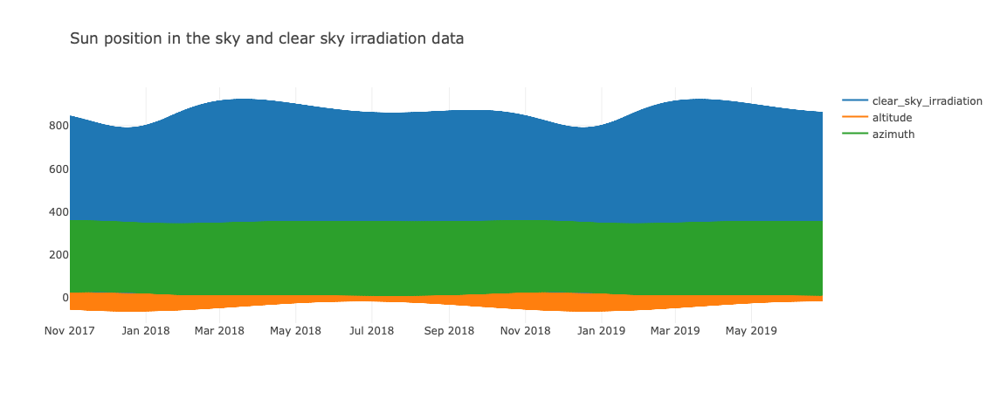

In [19]:
from plotly.offline import plot, iplot
import plotly.graph_objs as go
plotly.offline.init_notebook_mode(connected=True)


x=df_solar['date']
y=df_solar['clear_sky_irradiation'].values
# Create a trace
trace = go.Scatter(
    x = x,
    y = y,
    name = 'clear_sky_irradiation'
)

x2=df_solar['date']
y2=df_solar['altitude'].values
# Create a trace
trace2 = go.Scatter(
    x = x2,
    y = y2,
    name = 'altitude'
)

x3=df_solar['date']
y3=df_solar['azimuth'].values
# Create a trace
trace3 = go.Scatter(
    x = x3,
    y = y3,
    name = 'azimuth'
)

layout = go.Layout(
            title=go.layout.Title(
                text='Sun position in the sky and clear sky irradiation data',
                xref='paper',
                x=0
            ),
        )
data = [trace, trace2, trace3]
fig = go.Figure(data=data, layout=layout)


iplot(fig)

# Solar panel production data

The data for the solar panel production (measured as produced power in W) is taken from the vendors dashboard website. Hourly extraction is not easily possible, as the capabilities of the dashboard are limited. However, for each day the data can be downloaded as a csv file. In this work, a mouse macro was used to repeatedly download the csv for a day, move to the next day, download the csv, go to the next day and so on.

### 1. Investigate the structure of the csv files

First, the structure of the production files is investigated. Then they will be all combined in the next step.

In [46]:
path_to_files = './data/production/'

files = os.listdir(path_to_files)

# take only csv
files = [f for f in files if f.endswith('csv')]


df_tmp = pd.read_csv(f'{path_to_files}{files[0]}')

print(df_tmp.describe(),"\n")
print(df_tmp.info(),"\n")
df_tmp.head()

       System Production (W)
count              96.000000
mean             1557.083327
std              2162.043333
min                 0.000000
25%                 0.000000
50%                23.166650
75%              2616.750000
max              6330.333500 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 2 columns):
Time                     96 non-null object
System Production (W)    96 non-null float64
dtypes: float64(1), object(1)
memory usage: 1.6+ KB
None 



,Time,System Production (W)
0,25.03.2018 00:00,0.0
1,25.03.2018 00:15,0.0
2,25.03.2018 00:30,0.0
3,25.03.2018 00:45,0.0
4,25.03.2018 01:00,0.0


The file structure seems to be straightforward one column for the Time and one column for the system production. The datatypes for the Time column have to be altered from object to datetime. For this column, the format is DD.MM.YYYY HH:MM.

In [47]:
df_tmp['Time'] = pd.to_datetime(df_tmp['Time'], format='%d.%m.%Y %H:%M')

print(df_tmp.info(),"\n")
df_tmp.tail()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 2 columns):
Time                     96 non-null datetime64[ns]
System Production (W)    96 non-null float64
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.6 KB
None 



,Time,System Production (W)
91,2018-03-25 22:45:00,0.0
92,2018-03-25 23:00:00,0.0
93,2018-03-25 23:15:00,0.0
94,2018-03-25 23:30:00,0.0
95,2018-03-25 23:45:00,0.0


### 2. Load all csv's and combine into one dataframe

Now it is time to load all the csv. Note that due to how the data was generated, we can expect some duplicates, i.e. when the macro did not work properly in combination with the website. We need to take care of this.

In [56]:
path_to_files = './data/production/'

files = os.listdir(path_to_files)

# take only csv
files = [f for f in files if f.endswith('csv')]

df_production = pd.DataFrame()

# loop through files
for f in files:
    # load df
    df_0 = pd.read_csv(f'{path_to_files}{f}')
#     print(df_0.columns)
    # name the columns to be certain that the axis align
    df_0.columns = ['Time', 'Production']
    
    df_production = df_production.append(df_0, sort=True)

# convert Time column datatype to datetime
df_production['Time'] = pd.to_datetime(df_production['Time'], format='%d.%m.%Y %H:%M')

print(df_production.describe(),"\n")
print(df_production.info(),"\n")
df_production.head()

          Production
count  167040.000000
mean     1195.422325
std      1905.557358
min         0.000000
25%         0.000000
50%         0.000000
75%      1856.000000
max      6963.666500 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 167040 entries, 0 to 95
Data columns (total 2 columns):
Production    167040 non-null float64
Time          167040 non-null datetime64[ns]
dtypes: datetime64[ns](1), float64(1)
memory usage: 3.8 MB
None 



,Production,Time
0,0.0,2018-03-25 00:00:00
1,0.0,2018-03-25 00:15:00
2,0.0,2018-03-25 00:30:00
3,0.0,2018-03-25 00:45:00
4,0.0,2018-03-25 01:00:00


We expect a lot of duplicates among these, let's drop them!

In [57]:
# identify duplicated rows
df_dupl = df_production[df_production.duplicated()]
print(df_dupl.count(),'\n')

# drop duplicates
df_production_cleaned = df_production.drop_duplicates(subset=None, keep='first', inplace=False)


# check if it worked: identify duplicated rows
df_dupl = df_production_cleaned[df_production_cleaned.duplicated()]

# sort by time
df_production_cleaned = df_production_cleaned.sort_values(by='Time')

print(df_dupl.count(),'\n')
print(df_production_cleaned.describe(),"\n")
print(df_production_cleaned.info(),"\n")
print(df_production_cleaned.tail(),"\n")

df_production_cleaned.head()

Production    107136
Time          107136
dtype: int64 

Production    0
Time          0
dtype: int64 

         Production
count  59904.000000
mean     944.207911
std     1637.985607
min        0.000000
25%        0.000000
50%        0.000000
75%     1191.083350
max     6963.666500 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59904 entries, 0 to 95
Data columns (total 2 columns):
Production    59904 non-null float64
Time          59904 non-null datetime64[ns]
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.4 MB
None 

    Production                Time
91         0.0 2019-06-27 22:45:00
92         0.0 2019-06-27 23:00:00
93         0.0 2019-06-27 23:15:00
94         0.0 2019-06-27 23:30:00
95         0.0 2019-06-27 23:45:00 



,Production,Time
0,0.0,2017-10-12 00:00:00
1,0.0,2017-10-12 00:15:00
2,0.0,2017-10-12 00:30:00
3,0.0,2017-10-12 00:45:00
4,0.0,2017-10-12 01:00:00


In [58]:
df_production_cleaned.to_csv(f'{path_to_files}/solar_production.data') # make it .data so that it is not csv

In [116]:
# uncomment to read
df_production_cleaned = pd.read_csv(f'{path_to_files}/solar_production.data', index_col=0)
df_production_cleaned['Time'] = pd.to_datetime(df_production_cleaned['Time'], format='%Y-%m-%d %H:%M:%S')
df_production_cleaned.set_index('Time', inplace=True)

df_production_cleaned.head()

,Production
Time,
2017-10-12 00:00:00,0.0
2017-10-12 00:15:00,0.0
2017-10-12 00:30:00,0.0
2017-10-12 00:45:00,0.0
2017-10-12 01:00:00,0.0


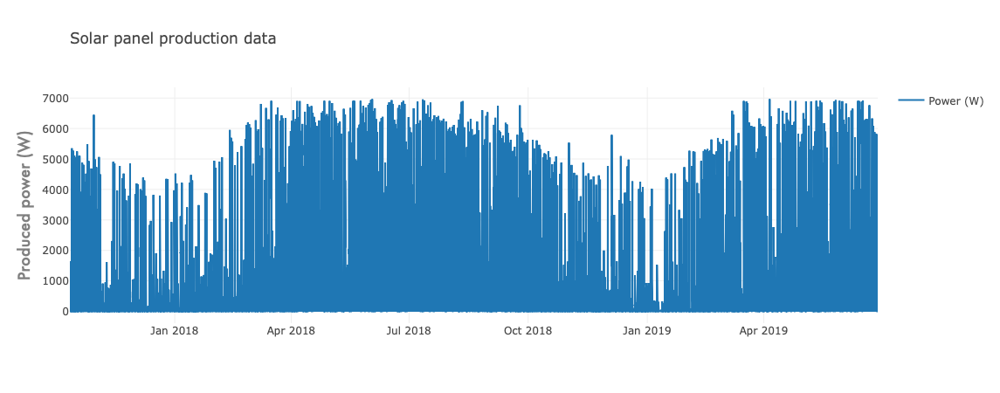

In [59]:
from plotly.offline import plot, iplot
import plotly.graph_objs as go
plotly.offline.init_notebook_mode(connected=True)


x=df_production_cleaned['Time']
y=df_production_cleaned['Production'].values
# Create a trace
trace = go.Scatter(
    x = x,
    y = y,
    name = 'Power (W)'
)


layout = go.Layout(
            title=go.layout.Title(
                text='Solar panel production data',
                xref='paper',
                x=0
            ),
            yaxis=go.layout.YAxis(
                title=go.layout.yaxis.Title(
                    text='Produced power (W)',
                    font=dict(
                        family='Futura',
                        size=18,
                        color='#7f7f7f'
                    )
                )
            ),
            showlegend=True
        )
data = [trace]
fig = go.Figure(data=data, layout=layout)


iplot(fig)

That seems to have worked flawlessly. Out of curiosity, I would like to check if there was a day were the produced power is zero.

In [60]:
# group by day and aggregate with the sum of produced
g_by_day = df_production_cleaned.groupby(df_production_cleaned['Time'].dt.date).sum()

print("Days with less than 1 kW production:",'\n')
g_by_day[g_by_day['Production'] < 1000]

Days with less than 1 kW production: 



,Production
Time,
2017-12-16,701.3332
2018-12-21,786.3332
2019-01-05,705.6667
2019-01-10,0.0000
2019-01-11,315.9998
2019-02-03,333.6666


Interesting! The winter of 2018 - 2019 was a very low output one compared to the one of the year before. Note that in this dataset, the n of winters is 2, since it only covers October 2017 until June 2019!

### 3. Resample hourly

For the weather and the solar data, there is only hourly data available. We would like to resample the solar production data down to hourly values.

In [90]:
# resample hourly
df_resampled = df_production_cleaned
# df_resampled.set_index('Time', inplace=True)

s_resampled = df_resampled['Production'].resample('H').median()

# resample hourly
df_resampled = df_production_cleaned
# df_resampled.set_index('Time', inplace=True)

s_resampled_mean = df_resampled['Production'].resample('H').mean()

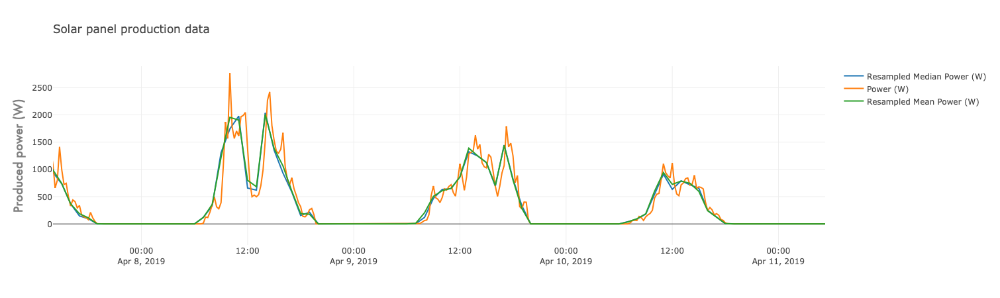

In [91]:
from plotly.offline import plot, iplot
import plotly.graph_objs as go
plotly.offline.init_notebook_mode(connected=True)


x=s_resampled.index
y=s_resampled.values
# Create a trace
trace = go.Scatter(
    x = x,
    y = y,
    name = 'Resampled Median Power (W)'
)

x=df_production_cleaned.index
y=df_production_cleaned['Production']
# Create a trace
trace2 = go.Scatter(
    x = x,
    y = y,
    name = 'Power (W)'
)



x=s_resampled_mean.index
y=s_resampled_mean.values
# Create a trace
trace3 = go.Scatter(
    x = x,
    y = y,
    name = 'Resampled Mean Power (W)'
)



layout = go.Layout(
            title=go.layout.Title(
                text='Solar panel production data',
                xref='paper',
                x=0
            ),
            yaxis=go.layout.YAxis(
                title=go.layout.yaxis.Title(
                    text='Produced power (W)',
                    font=dict(
                        family='Futura',
                        size=18,
                        color='#7f7f7f'
                    )
                )
            ),
            showlegend=True
        )
data = [trace, trace2, trace3]
fig = go.Figure(data=data, layout=layout)


iplot(fig)

In [122]:
# lets save the mean and median resampled one
pd.DataFrame(s_resampled_mean).to_csv(f'{path_to_files}/solar_production_resampled_mean.data') # make it .data so that it is not csv
pd.DataFrame(s_resampled).to_csv(f'{path_to_files}/solar_production_resampled_median.data') # make it .data so that it is not csv